# Setup

In [1]:
import numpy as np
import cv2

import glob

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# Calibrate Camera

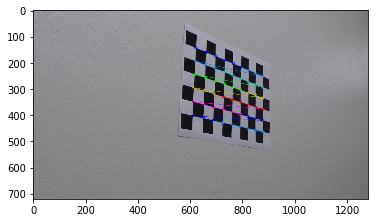

In [2]:
# Load all chessboard images
FILE_PATH = './camera_cal/calibration*.jpg'
def calibrate(filepath=FILE_PATH, nx=9, ny=6):
    images = glob.glob(filepath)

    objpoints = []
    imgpoints = []

    objp = np.zeros((ny*nx, 3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

    for fname in images:
        #read in each image
        img = mpimg.imread(fname)
        plt.imshow(img)

        #convert image to grayscale
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        # Fine the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        # If corners are found, add objects point, image points
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)

            img = cv2.drawChessboardCorners(img, (ny, nx), corners, ret)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)
    destination = cv2.undistort(img, mtx, dist, None, mtx)
    plt.imshow(destination)
    return mtx, dist
mtx, dist = calibrate()

def undistort(img, mtx, dist=None):
    return cv2.undistort(img, mtx, dist, None, mtx)

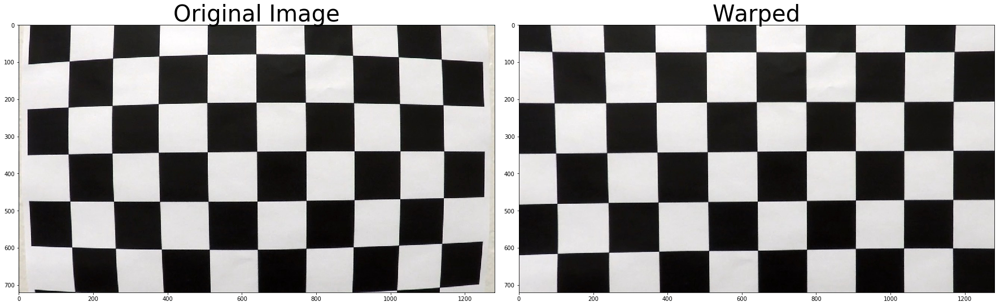

In [4]:
images = glob.glob(FILE_PATH)
image_name = FILE_PATH.replace('*','1') # grab the first image

img = mpimg.imread(image_name)
undist = cv2.undistort(img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(img)

ax1.set_title('Original Image', fontsize=40)

ax2.imshow(undist)
ax2.set_title('Warped', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

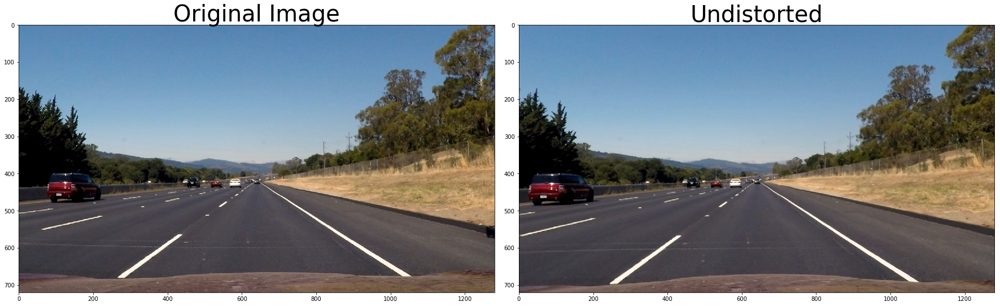

In [5]:
img = mpimg.imread('./test_images/straight_lines2.jpg')
undist = undistort(img, mtx, dist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(img)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(undist)
ax2.set_title('Undistorted', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Create Binary Thresholded Image

In [6]:
def make_binary(img, s_thresh=(120, 255), sx_thresh=(20, 255), l_thresh=(40,255), sobel_kernel=3, plot=False):
    img = np.copy(img)

    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)

    h_channel = hls[:,:,1]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]

    if plot:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        ax1.imshow(l_channel, cmap='gray')
        ax2.imshow(s_channel, cmap='gray')

    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1

    # Threshold lightness
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1

        
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0, ksize=sobel_kernel) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    
    # Stack each channel
    color = 255 * np.dstack(( l_binary, sxbinary, s_binary)).astype('uint8')

    combined = np.zeros_like(sxbinary)
    combined[(l_binary == 1) | (s_binary == 1) | (sxbinary == 1)] = 1
    combined = (255 * combined).astype('uint8')

    binary = np.zeros_like(sxbinary)
    binary[((l_binary == 1) & (s_binary == 1) | (sxbinary==1))] = 1
    binary = (255*binary).astype('uint8')

    return binary, color

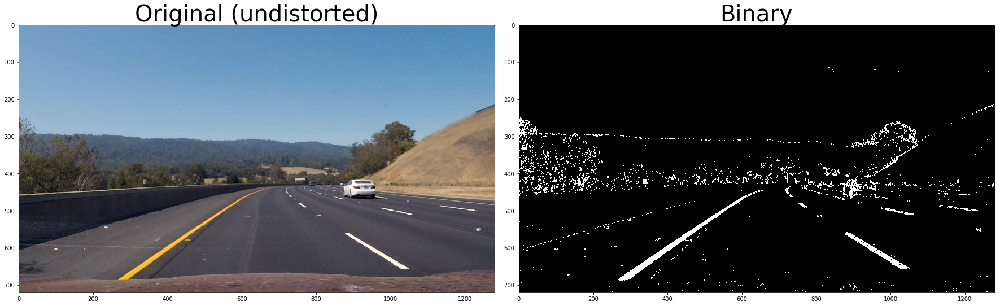

In [7]:
fname = './test_images/test3.jpg'
img = mpimg.imread(fname)
binary, color = make_binary(img, plot=False)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(img)
ax1.set_title('Original (undistorted)', fontsize=40)

ax2.imshow(binary, cmap='gray')
ax2.set_title('Binary', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Perspective Transform (Birds-Eye)

In [8]:
def warper(img, src, dst):
    src = np.float32(src)
    dst = np.float32(dst)

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)

    # Warp the image using OpenCV warpPerspective()
    warped = warp_image(img, M)
    return warped, M, Minv

def warp_image(img, M):
    return cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)

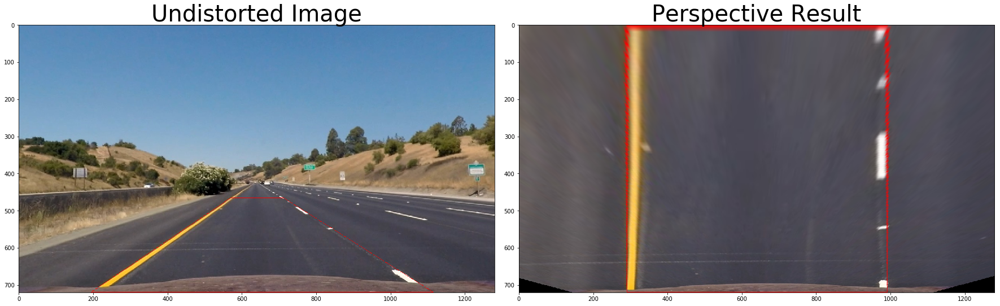

In [9]:
# load straight line image
fname = './test_images/straight_lines1.jpg'
img = mpimg.imread(fname)
undist = undistort(img, mtx, dist)

src = [
        [194, undist.shape[0] - 1], 
        [1115, undist.shape[0] - 1], 
        [712, undist.shape[0] - 255],
        [570, undist.shape[0] - 255], 
      ]

base = 290
dst = [
        [base, undist.shape[0] - 1], 
        [1280 - base, undist.shape[0] - 1], 
        [1280 - base, 0],
        [base, 0], 
      ]
# print(src)
# print(dst)

# draw trapezoid on the image
cv2.line(undist, tuple(src[0]), tuple(src[1]), color=[255,0,0], thickness=1)
cv2.line(undist, tuple(src[1]), tuple(src[2]), color=[255,0,0], thickness=1)
cv2.line(undist, tuple(src[2]), tuple(src[3]), color=[255,0,0], thickness=1)
cv2.line(undist, tuple(src[3]), tuple(src[0]), color=[255,0,0], thickness=1)

# warp image and save the distortion matrix
perspectived, M, Minv = warper(undist, src, dst)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(undist)
ax1.set_title('Undistorted Image', fontsize=40)

ax2.imshow(perspectived)
ax2.set_title('Perspective Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Finding Lane Lines

In [10]:
# First mask the image to ignore potential noise especially at the bottom of the image
def region_of_interest(img):
    """
    Black out regions such that the bottom of the image
    We know the beginning of the lane line closest to the 
    car should be within a rough specific location.
    """    
    shape = img.shape
    vertices = np.array([[(0,0),
                          (shape[1],0),
                          (shape[1],0),
                          (6*shape[1]/7,shape[0]),
                          (shape[1]/7,shape[0]), 
                          (0,0)]],
                        dtype=np.int32)

    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


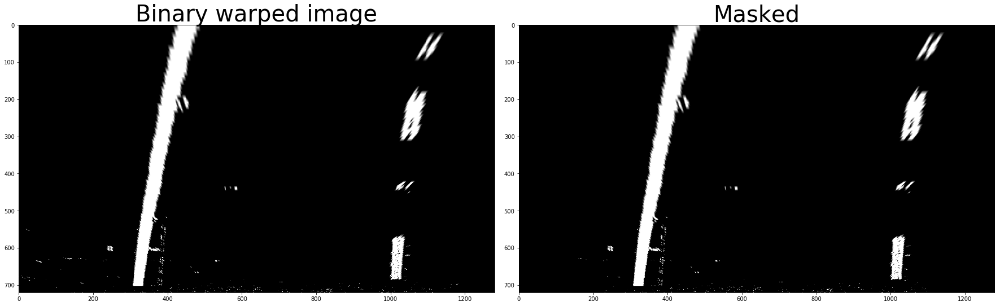

In [11]:
fname = './test_images/test3.jpg'
img = mpimg.imread(fname)
binary, color = make_binary(img, plot=False)

binary_warped = warp_image(binary, M)
binary_warped_masked = region_of_interest(binary_warped)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(binary_warped, cmap='gray')
ax1.set_title('Binary warped image', fontsize=40)

ax2.imshow(binary_warped_masked, cmap='gray')
ax2.set_title('Masked', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [12]:
def sliding_window(binary_warped, plot=False):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)

    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255    
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9

    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Set the width of the windows +/- margin
    margin = 80

    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
        
    return _helper(out_img, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, plot, 'Sliding Window')

def fit_using_prev(binary_warped, left_fit, right_fit, plot=False):
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255    
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    margin = 80

    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    return _helper(out_img, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, plot, 'Previous Fit')


def _helper(out_img, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, plot=False, plot_title=''):
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, out_img.shape[0]-1, out_img.shape[0] )

    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0] #
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    if plot:
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.title(plot_title)
    
    y_eval = np.max(ploty)

    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3./130. # meters per pixel in y dimension (1 lane line is 3m or 130px)
    xm_per_pix = 3.7/700. # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters

    return left_fit, right_fit, left_fit_cr, right_fit_cr


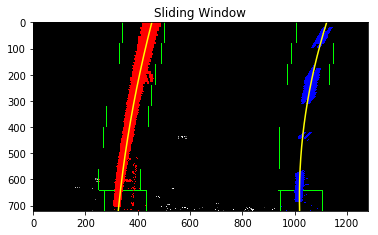

In [13]:
left_fit, right_fit, left_fit_cr, right_fit_cr = sliding_window(binary_warped_masked, plot=True)

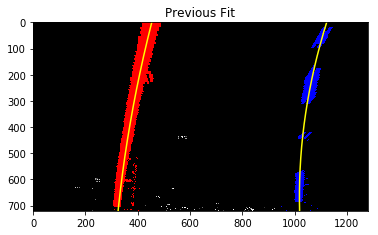

In [14]:
left_fit, right_fit, left_fit_cr, right_fit_cr = fit_using_prev(region_of_interest(binary_warped), left_fit, right_fit, plot=True)

# Calculate Radius and Deviation

In [15]:
def calculate_curvature_and_offset(img, left_fit, right_fit, left_fit_cr, right_fit_cr):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3./130. # meters per pixel in y dimension (1 lane line is 3m or 130px)
    xm_per_pix = 3.7/700. # meters per pixel in x dimension
    
    out_img = np.dstack((img, img, img))*255    

    ploty = np.linspace(0, img.shape[0] - 1, img.shape[0])

    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    y_eval = np.max(ploty)

    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters

    center_offset = (right_fitx[-1] + left_fitx[-1])/2.0 - 1280.0/2.0
    center_offset *= xm_per_pix
    
    return left_curverad, right_curverad, center_offset

In [19]:
left_curverad, right_curverad, center_offset = calculate_curvature_and_offset(binary_warped_masked, left_fit, right_fit, left_fit_cr, right_fit_cr)
print(left_curverad, right_curverad, center_offset)

480.473444412 214.694947906 0.169335578204


# Draw calculated lane lines

In [20]:
def draw_lane(img, left_fit, right_fit, left_curverad, right_curverad, center_offset, Minv, plot=False):
    img = np.copy(img)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(img[:,:,0]).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # recalculate
    ploty = np.linspace(0, img.shape[0] - 1, img.shape[0])

    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    distance_string = 'distance from center: {:.2f}m'.format(center_offset)

    curvature = 0.5*(round(right_curverad,1) + round(left_curverad,1))
    curvature_string = 'radius of curvature: {:.2f}m'.format(curvature)

    cv2.putText(result,distance_string,(430, 640), font, 1,(0,0,255), 2, cv2.LINE_AA)
    cv2.putText(result, curvature_string,(430,600), font, 1, (0,0,255), 2, cv2.LINE_AA)    
    
    return result



Text(0.5,1,'Draw Lanes')

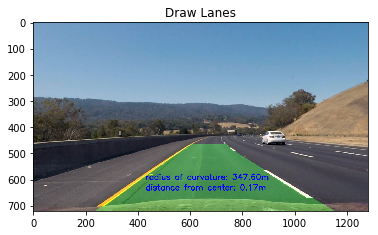

In [21]:
result = draw_lane(img, left_fit, right_fit, left_curverad, right_curverad, center_offset, Minv=Minv)
plt.imshow(result)
plt.title('Draw Lanes')


# Final Pipeline

In [25]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

left_line = Line()
right_line = Line()

def process_image(image):
    # Camera distortion matrices
    global M
    global Minv
    
    # globals to keep track of line state defined below
    global left_line
    global right_line
    
    imageX = np.copy(image)
    binaryX, _ = make_binary(imageX)
    binary_warpedX = warp_image(binaryX, M)
    binary_warped_maskedX = region_of_interest(binary_warpedX)

    if not left_line.detected or not right_line.detected:
        left_fit, right_fit, left_fit_cr, right_fit_cr = sliding_window(binary_warped_maskedX)
    else:
        left_fit, right_fit, left_fit_cr, right_fit_cr = fit_using_prev(binary_warped_maskedX, left_line.best_fit, right_line.best_fit)
        
    left_line.update(left_fit, left_fit_cr)
    right_line.update(right_fit, right_fit_cr)

    left_curverad, right_curverad, center_offset = calculate_curvature_and_offset(binary_warped_maskedX, left_line.best_fit, right_line.best_fit, left_line.best_fit_cr, right_line.best_fit_cr)
    result = draw_lane(image, left_fit, right_fit, left_curverad, right_curverad, center_offset, Minv=Minv)

    return result



In [26]:
# Define a class to maintain state of the Lines
class Line():
    def __init__(self, n=5):
        self.queue_size = n
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None    
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None
        self.best_fit_cr = None
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        self.current_fit_cr = []  

        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
    
    def update(self, fit, fit_cr):
        if self.best_fit is not None:
            # if we have a best fit, see how this new fit compares
            self.diffs = abs(fit-self.current_fit[0])
        if (self.diffs[0] > 0.001 or self.diffs[1] > 1.0 or self.diffs[2] > 100.) and \
           len(self.current_fit) > 0:
            # skip current frame if way off from previous frames
            print('bad fit compared to previous frames, skip current frame')
            self.detected = False

        else:
            self.detected = True
            # queue of `queue_size` 
            self.current_fit = [fit] + self.current_fit
            self.current_fit = self.current_fit[:self.queue_size]
            self.best_fit = self.current_fit[0]
            self.best_fit = np.average(self.current_fit, axis=0)

            # keep track of fit in physical dimensions as well
            # queue of `queue_size` 
            self.current_fit_cr = [fit_cr] + self.current_fit_cr
            self.current_fit_cr = self.current_fit_cr[:self.queue_size]
            self.best_fit_cr = self.current_fit_cr[0]
            self.best_fit_cr = np.average(self.current_fit_cr, axis=0)

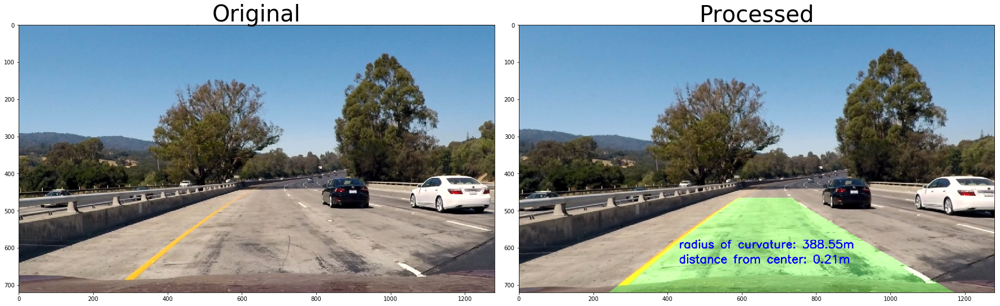

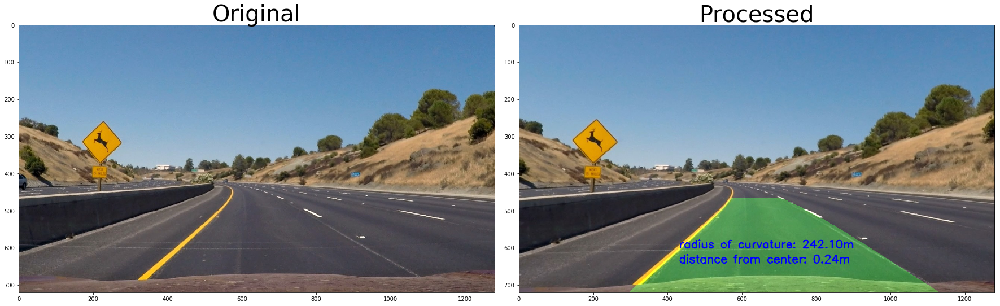

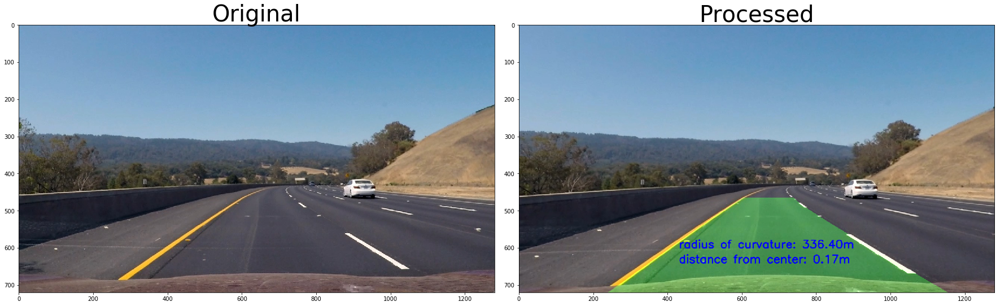

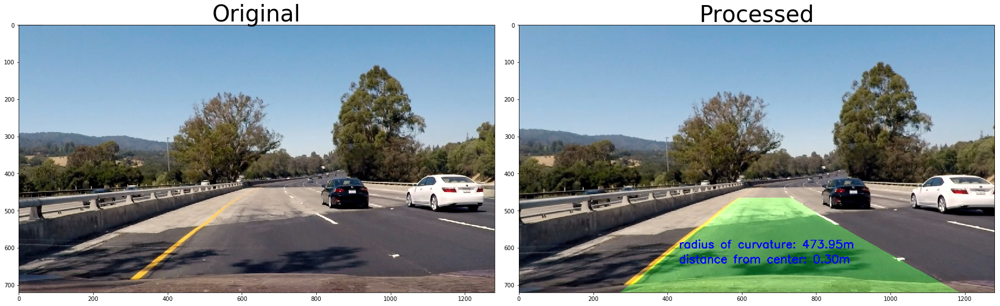

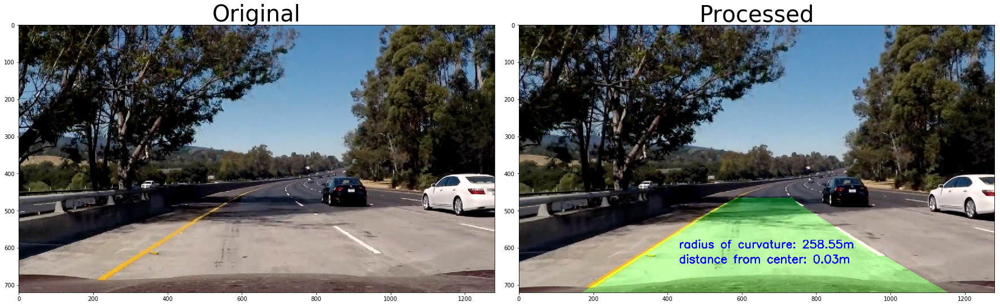

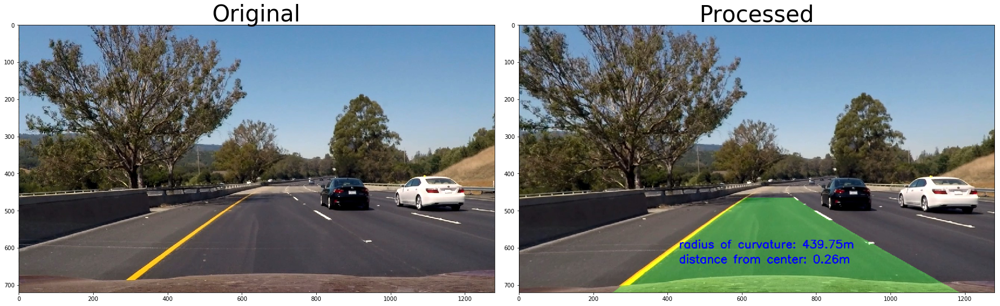

In [27]:
images = glob.glob('./test_images/test*.jpg')

for fname in images:
    img = mpimg.imread(fname)
    left_line = Line()
    right_line = Line()
    left_line.best_fit_cr
    output = process_image(img)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    
    ax1.imshow(img)
    ax1.set_title('Original', fontsize=40)
    
    ax2.imshow(output)
    ax2.set_title('Processed', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


In [28]:
output_video = './output_images/output_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("./project_video.mp4")

left_line = Line()
right_line = Line()

white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video ./output_images/output_video.mp4
[MoviePy] Writing video ./output_images/output_video.mp4


 96%|█████████▌| 25/26 [00:05<00:00,  5.03it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_images/output_video.mp4 

CPU times: user 4.76 s, sys: 1.34 s, total: 6.1 s
Wall time: 5.97 s
